# MIT 

In [1]:
import albumentations as A        # For data augmentation
import cv2                        # For loading images
import matplotlib.pyplot as plt   # For plotting images
import numpy as np
import random

## Read Image

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
def visualize(image):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)

In [4]:
image = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/Augmentation/input/original_parrot.jpg')  # BGR


In [5]:
print(image.shape)

(847, 1280, 3)


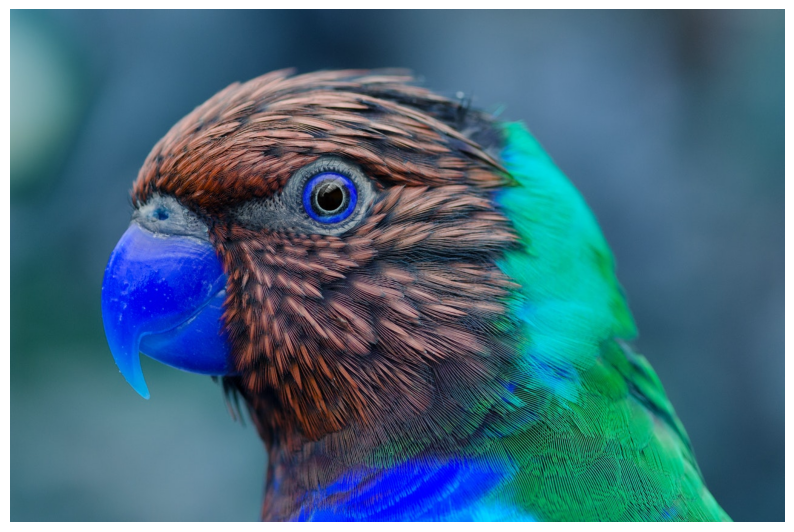

In [6]:
# cv2_imshow(image)
visualize(image)

In [7]:
# converting BGR to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

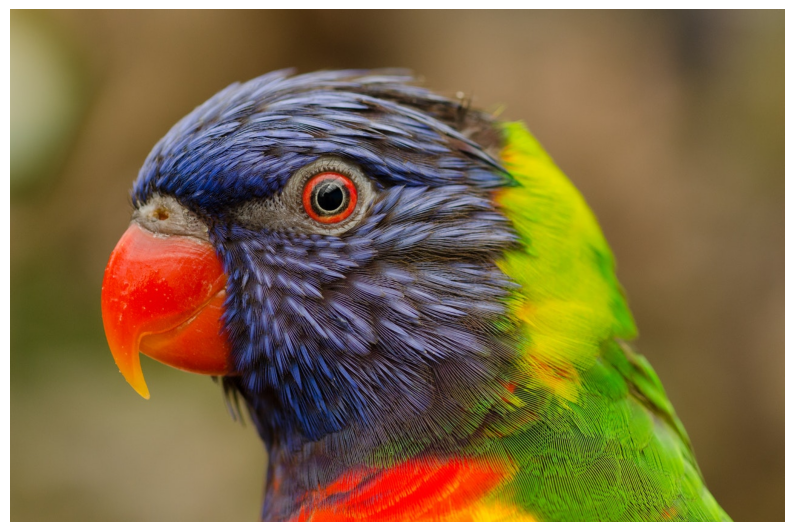

In [8]:
visualize(image)

OpenCV provides us several interpolation methods for resizing an image.


Choice of Interpolation Method for Resizing:

1. cv2.INTER_AREA: This is used when we need to shrink an image.

2. cv2.INTER_CUBIC: This is slow but more efficient.

3. cv2.INTER_LINEAR: This is primarily used when zooming is required. This is the default interpolation technique in OpenCV.

In [9]:
width = 1280
height = 1280
dim = (width, height)
  
# resize image
resized = cv2.resize(image, dim, interpolation = cv2.INTER_CUBIC)

Resized Dimensions :  (1280, 1280, 3)


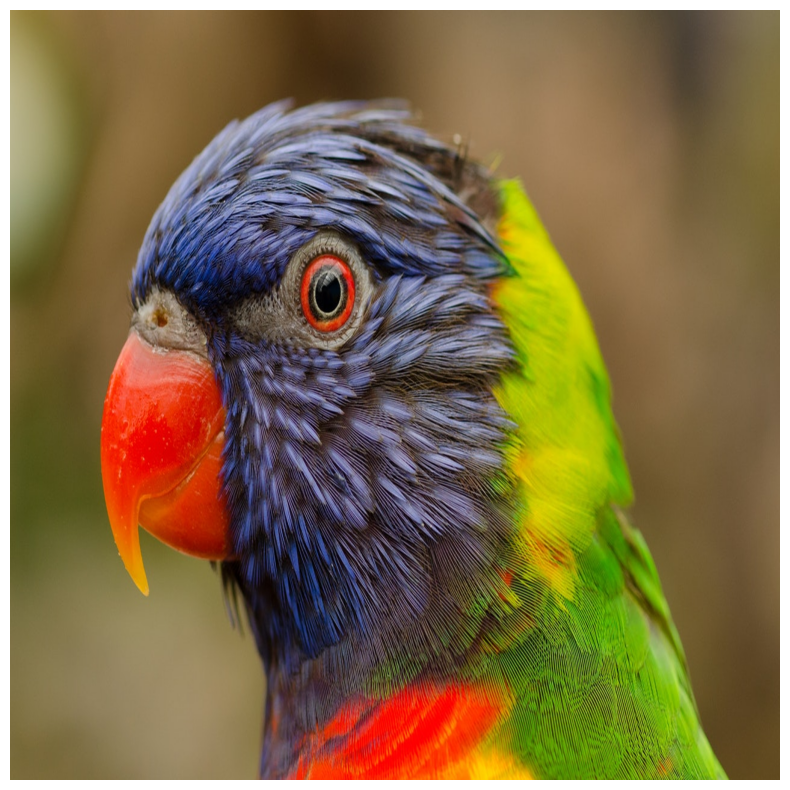

In [10]:
print('Resized Dimensions : ',resized.shape)
 
visualize(resized)

In [11]:
print(A.__version__)

1.2.1


# Transforms 

1.   [CROP](https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#albumentations.augmentations.crops.transforms.Crop)
2.   [Resize](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.resize.Resize)
3.  [Flip](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.Flip)
4.  [VerticalFlip](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.VerticalFlip)
5.  [HorizontalFlip](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.HorizontalFlip)
6.  [Transpose](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.Transpose)
7.  [Rotate](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.rotate.Rotate)
8.  [Scale](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.resize.RandomScale)
9.  [RGB_SHIFT](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.RGBShift)
10. [BLUR](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.blur.transforms.Blur)
11. [CLAHE](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.CLAHE)
12. [ColorJitter](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.ColorJitter)
13. [Downscale](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.Downscale)
14. [ShiftScaleRotate](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.geometric.transforms.ShiftScaleRotate)
15. [GaussNoise](https://albumentations.ai/docs/api_reference/augmentations/transforms/)



In [ ]:
from matplotlib import pyplot as plt
%matplotlib inline

# Individual Transform

#Resize

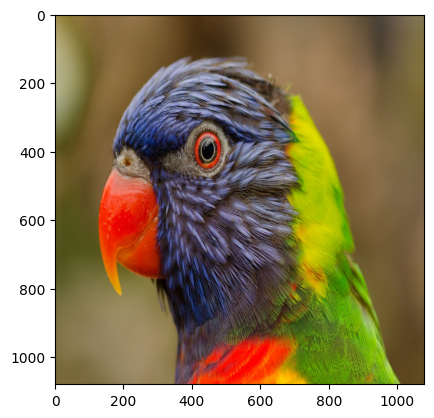

In [12]:
resize = A.Resize(height = 1080, width = 1080, interpolation = 3)
augmentation = resize(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# Crop

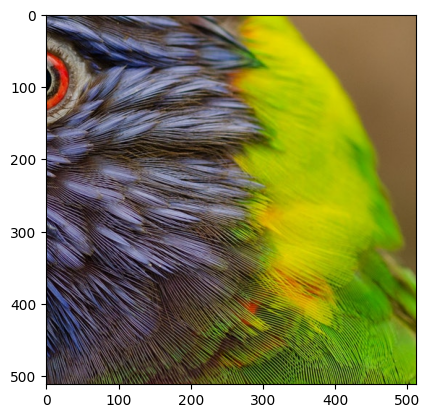

In [13]:
randomCrop = A.RandomCrop (height = 512, width = 512, always_apply=False, p=0.5)
augmentation = randomCrop(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

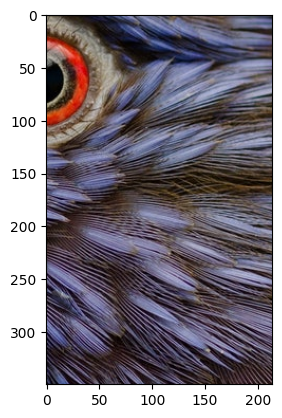

In [35]:
centerCrop = A.CenterCrop (height = 350, width = 214, always_apply=False, p=1.0)
augmentation = centerCrop(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# Rotate

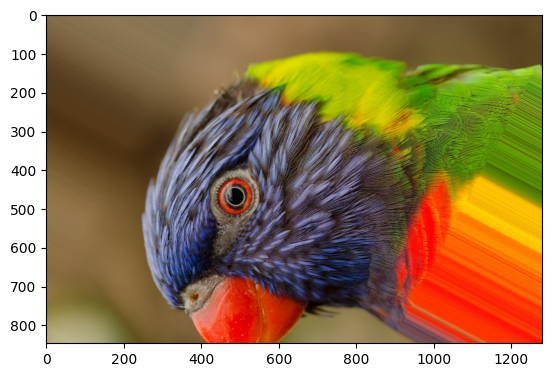

In [46]:
rotate = A.Rotate (limit= -90, interpolation=1, border_mode=1, value=None, mask_value=None, crop_border=False, always_apply=False, p=1.0)
augmentation = rotate(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# Flip

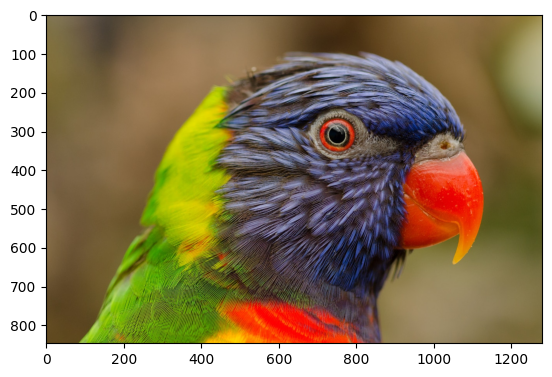

In [56]:
flip = A.Flip(p = 1.0)
augmentation = flip(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

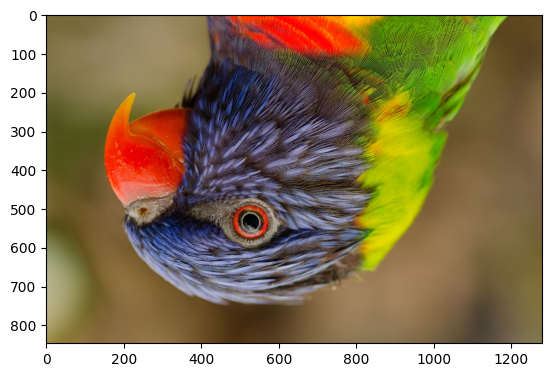

In [58]:
V_flip = A.VerticalFlip(p = 1.0)
augmentation = V_flip(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# RGB Shift

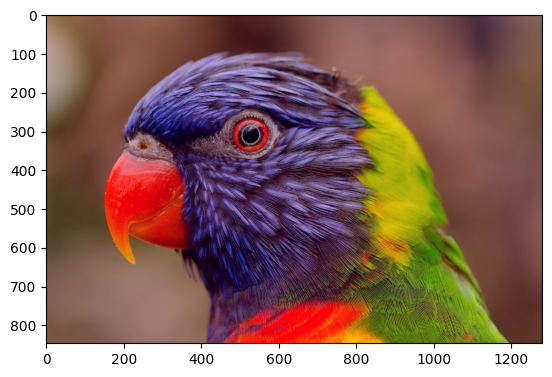

In [59]:
rgbShift = A.RGBShift (r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, always_apply=False, p=1.0)
augmentation = rgbShift(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# BLUR

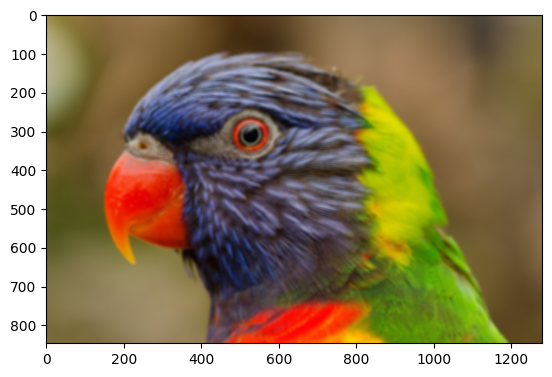

In [65]:
blur = A.Blur (blur_limit=20, always_apply=False, p=1.0)
augmentation = blur(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

Gaussian Blur

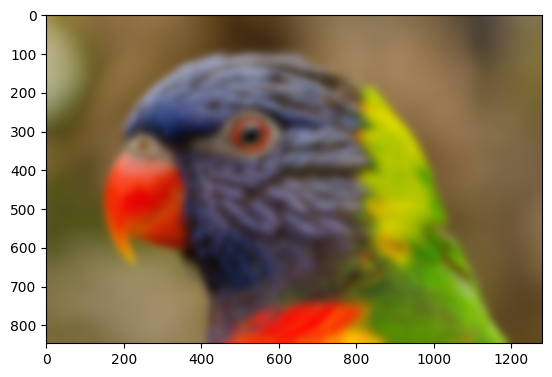

In [71]:
g_blur = A.GaussianBlur (blur_limit=71, sigma_limit=0, always_apply=False, p=1.0) # only takes odd number
augmentation = g_blur(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

Glass Blue

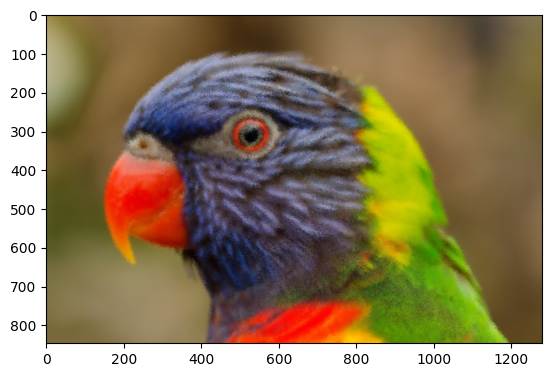

In [73]:
glass_blur = A.GlassBlur (sigma=0.7, max_delta=4, iterations=2, always_apply=False, mode='fast', p=1.0)
augmentation = glass_blur(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# Contrast Limited Adaptive Histogram Equalization

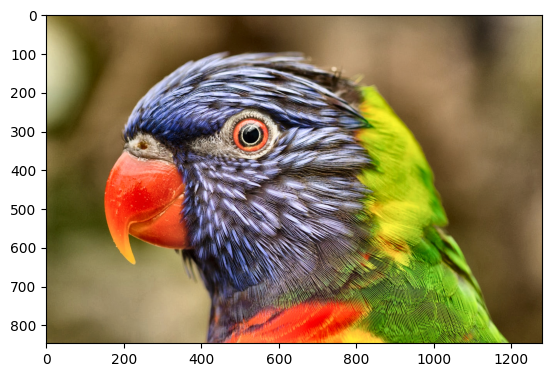

In [74]:
clahe = A.CLAHE (clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=1.0)
augmentation = clahe(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# Color Jitter

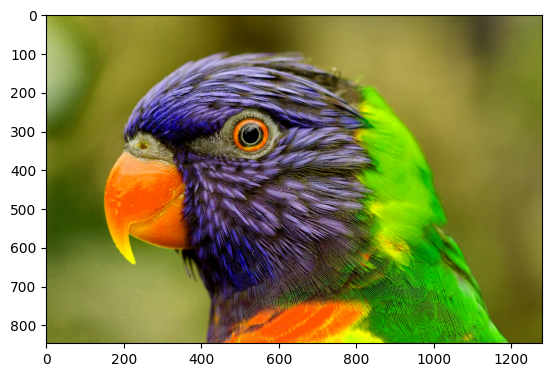

In [75]:
color_jitter = A.ColorJitter (brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, always_apply=False, p=1.0)
augmentation = color_jitter(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# Scale

Downscale

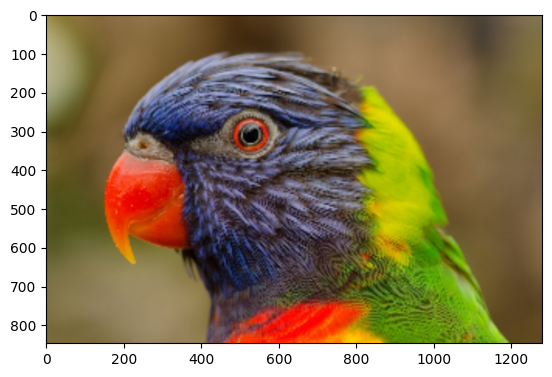

In [76]:
downscale = A.Downscale (scale_min=0.25, scale_max=0.25, interpolation=None, always_apply=False, p=1.0)
augmentation = downscale(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

RandomScale

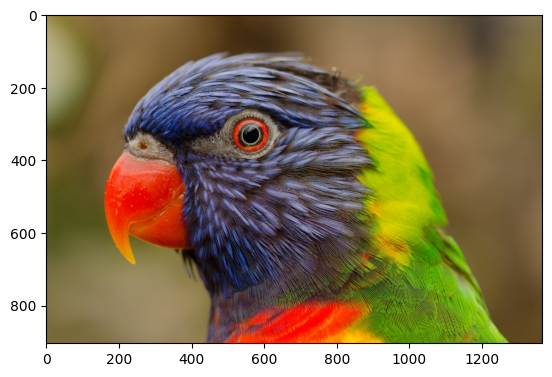

In [77]:
randomscale = A.RandomScale (scale_limit=0.1, interpolation=1, always_apply=False, p=1.0)
augmentation = randomscale(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

Shift, scale, rotate

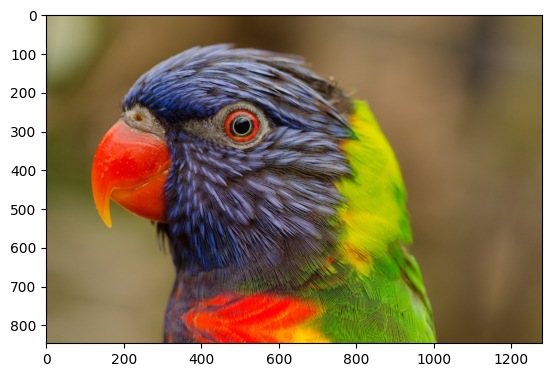

In [78]:
Shift_Scale_Rotate = A.ShiftScaleRotate (shift_limit=0.0625, scale_limit=0.1, rotate_limit=45, interpolation=1, border_mode=4, value=None, mask_value=None, shift_limit_x=None, shift_limit_y=None, rotate_method='largest_box', always_apply=False, p=1.0)
augmentation = Shift_Scale_Rotate(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# Noise

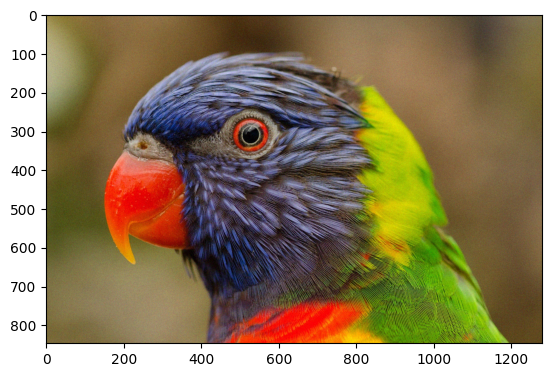

In [81]:
g_noise = A.GaussNoise (var_limit=(10.0, 100.0), mean=0, per_channel=True, always_apply=False, p=1.0)
augmentation = g_noise(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# Brightness and contrast

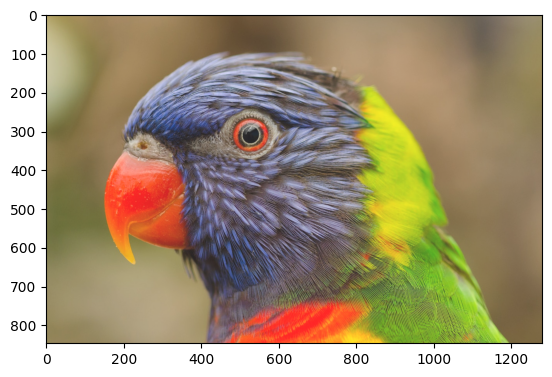

In [82]:
BC = A.RandomBrightnessContrast (brightness_limit=0.2, contrast_limit=0.2, brightness_by_max=True, always_apply=False, p=1.0)
augmentation = BC(image = image)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

# City Stuff

In [83]:
city = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/Augmentation/input/city.jpeg')  # BGR
# converting BGR to RGB
city = cv2.cvtColor(city, cv2.COLOR_BGR2RGB)

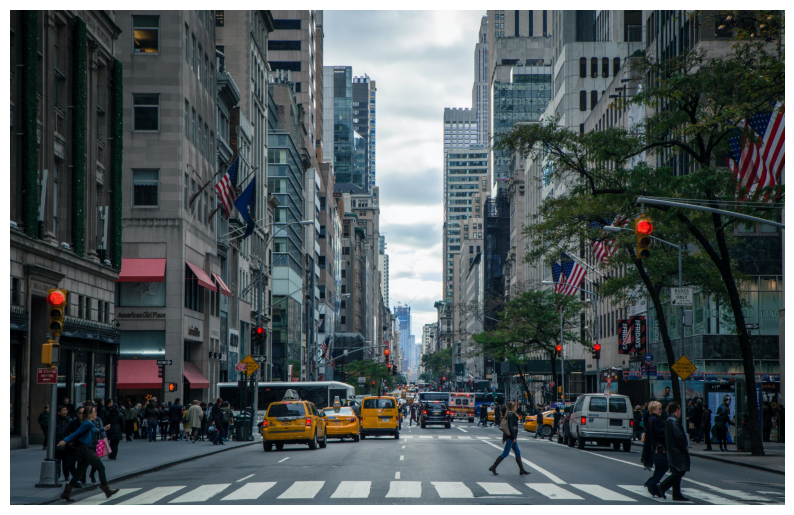

In [85]:
visualize(city)

Rain

[RandomRain](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.RandomRain)

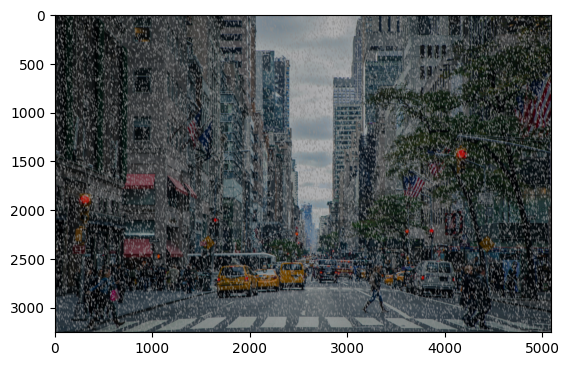

In [88]:
rain = A.RandomRain (slant_lower=-10, slant_upper=10, drop_length=20, drop_width=3, drop_color=(200, 200, 200), blur_value=7, brightness_coefficient=0.7, rain_type=None, always_apply=False, p=1.0)
augmentation = rain(image = city)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

Solarize

[Solarize](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.Solarize)

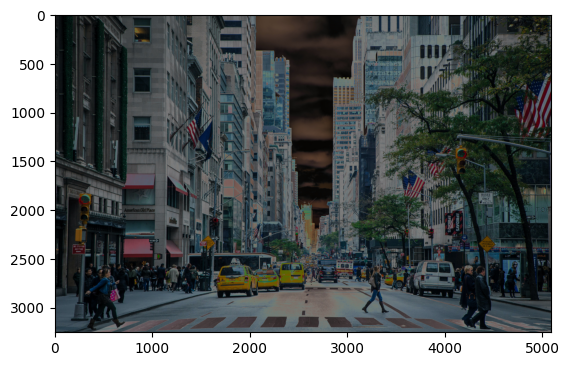

In [89]:
solarize = A.Solarize (threshold=128, always_apply=False, p=1.0)
augmentation = solarize(image = city)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

Sun Flare

[RandomSunFlare](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.RandomSunFlare)

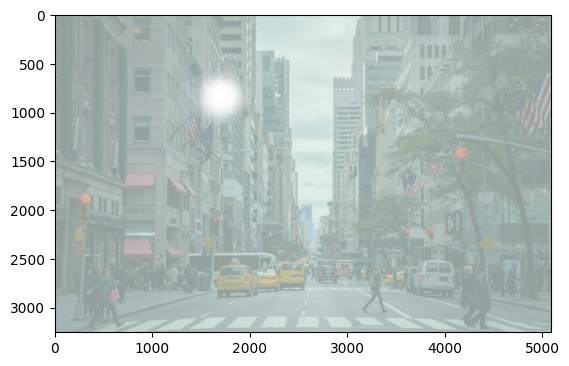

In [90]:
flare = A.RandomSunFlare (flare_roi=(0, 0, 1, 0.5), angle_lower=0, angle_upper=1, num_flare_circles_lower=6, num_flare_circles_upper=10, src_radius=400, src_color=(255, 255, 255), always_apply=False, p=1.0)
augmentation = flare(image = city)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

Fog

[RandomFog](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.RandomFog)

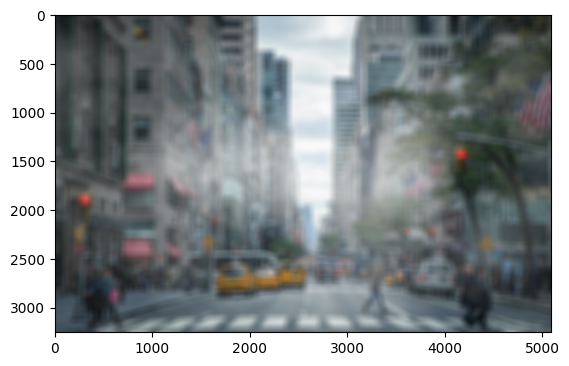

In [95]:
fog = A.RandomFog (fog_coef_lower=0.5, fog_coef_upper=0.5, alpha_coef=0.06, always_apply=False, p=1.0)
augmentation = fog(image = city)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

Snow

[RandomSnow](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.RandomSnow)

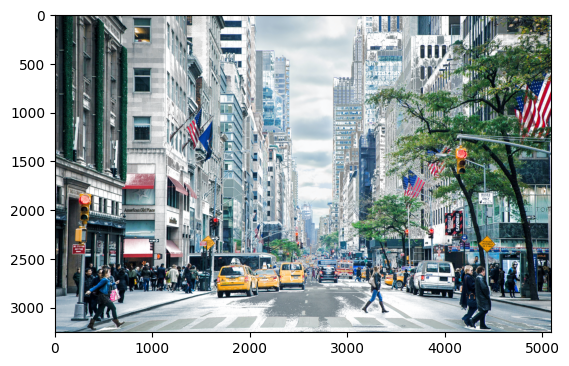

In [96]:
snow = A.RandomSnow (snow_point_lower=0.1, snow_point_upper=0.3, brightness_coeff=2.5, always_apply=False, p=1.0)
augmentation = snow(image = city)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()

Shadow

[RandomShadow](https://albumentations.ai/docs/api_reference/full_reference/#albumentations.augmentations.transforms.RandomShadow)

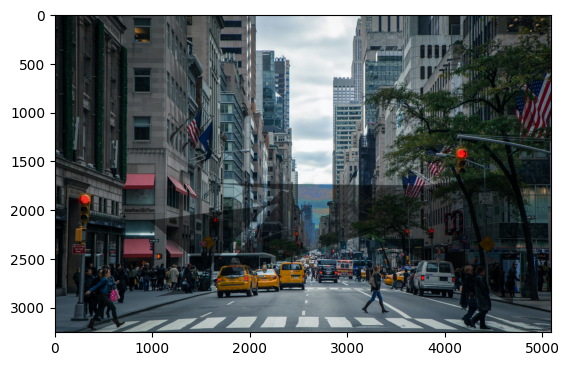

In [100]:
shadow = A.RandomShadow (shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=5, always_apply=True, p=1.0)
augmentation = shadow(image = city)
augmented_img = augmentation["image"]
plt.imshow(augmented_img)
plt.show()